In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [ ]:
run_id = '6aee580ab389491487c651941292b0c2'
train_epochs = 7
start_epoch = 7
dataset_size = 100000
lr = 1e-4
decay_rate = 5e-5
decay_steps = 1
style_loss_weight = 2
tv_weight = 0
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

d:\Python\StyleTransferAI\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 37 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=125, test_steps=125)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 695677.4375 - val_loss: 671484.8750
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 592003.1875 - val_loss: 641701.0000
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 618222.0625 - val_loss: 611764.9375
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 744273.0000 - val_loss: 1876559.1250
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 936234.1875 - val_loss: 676878.8125
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 740940.9375 - val_loss: 544613.6875
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 599784.8750 - val_loss: 758506.7500
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 643199.6875 - val_loss: 593880.5000
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 666778.6875 - val_loss: 582032.3750
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 645249.9375 - 

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 648344.5000 - val_loss: 644262.1875
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 632186.2500 - val_loss: 635881.0625
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 623014.5625 - val_loss: 797334.0000
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 741692.1250 - val_loss: 894568.0625
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 592065.8125 - val_loss: 682586.0000
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 596014.4375 - val_loss: 778617.5625
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 597938.5625 - val_loss: 583240.5000
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 555ms/step - loss: 570746.8125 - val_loss: 514286.3750
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 543662.9375 - val_loss: 728347.5625
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 554ms/step - loss: 804429

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 566215.6875 - val_loss: 587111.7500
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 515761.5312 - val_loss: 538587.3750
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 748068.3750 - val_loss: 559081.4375
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 596907.5625 - val_loss: 617610.8125
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 573221.6250 - val_loss: 538419.4375
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 508948.6562 - val_loss: 578220.6875
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 605038.5000 - val_loss: 525228.0625
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 591505.9375 - val_loss: 597665.3750
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 513287.0000 - val_loss: 555895.3750
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 595646

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 522407.5000 - val_loss: 580123.0000
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 551625.6875 - val_loss: 469752.3125
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 720340.8750 - val_loss: 505568.9062
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 521665.6250 - val_loss: 520879.0312
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 564519.3750 - val_loss: 489964.8125
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 538509.0625 - val_loss: 480643.6250
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 511371.0000 - val_loss: 584691.6875
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 504433.0312 - val_loss: 549643.2500
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 547250.2500 - val_loss: 520675.2500
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 520953

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 493597.6875 - val_loss: 518511.0625
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 554681.5625 - val_loss: 517760.2812
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 485627.4375 - val_loss: 673400.1250
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 624926.5000 - val_loss: 637731.8750
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 508186.3125 - val_loss: 465428.9062
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 483976.9062 - val_loss: 484273.2188
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 568911.7500 - val_loss: 468957.5312
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 480004.1250 - val_loss: 514941.9062
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 494686.9062 - val_loss: 451577.2500
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 462708

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 485441.0625 - val_loss: 573920.0000
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 464977.5938 - val_loss: 466339.9062
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 455376.1875 - val_loss: 450567.7188
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 491885.3438 - val_loss: 475368.4062
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 501582.4375 - val_loss: 478225.7188
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 535265.0625 - val_loss: 436197.3750
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 755657.1250 - val_loss: 508868.0312
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 533402.1875 - val_loss: 509532.4688
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 451090.3125 - val_loss: 525112.8125
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 462454

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 546407.5000 - val_loss: 510980.9688
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 503006.4688 - val_loss: 518948.2500
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 486669.6875 - val_loss: 444890.9062
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 484877.2188 - val_loss: 533366.0625
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 441051.9688 - val_loss: 457467.0938
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 526013.9375 - val_loss: 419740.4375
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 553ms/step - loss: 499729.6875 - val_loss: 525694.8125
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 461003.3438 - val_loss: 487758.7500
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 477718.4062 - val_loss: 452625.2188
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 456214

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

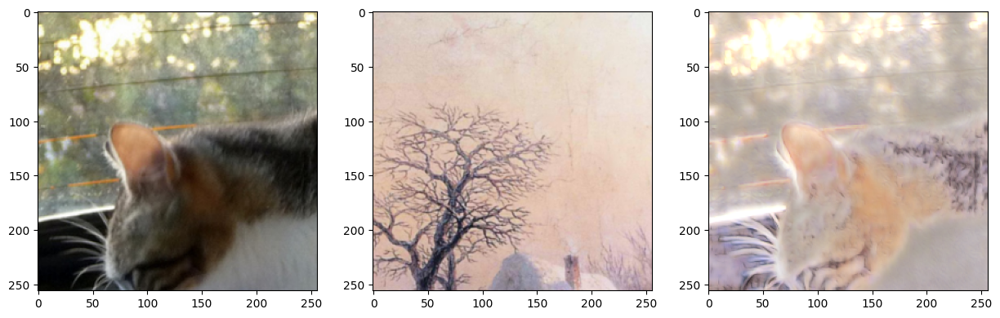

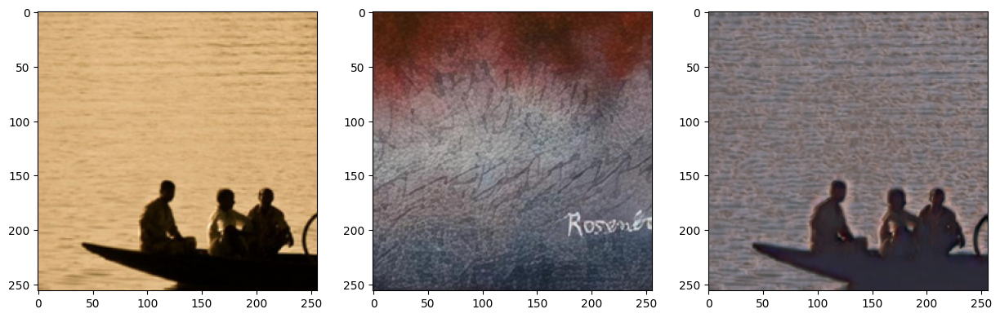

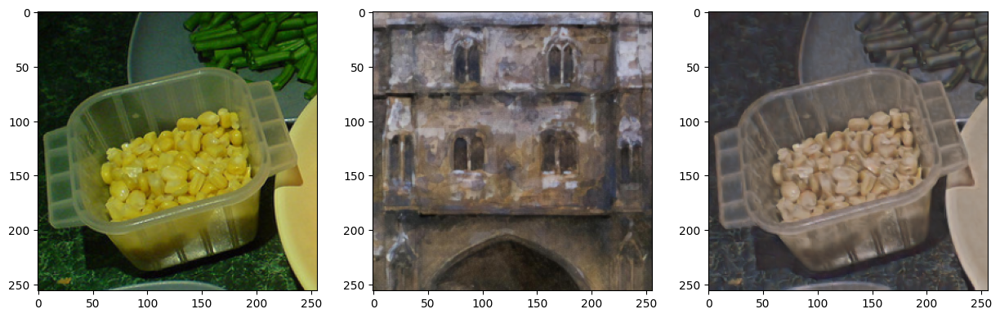

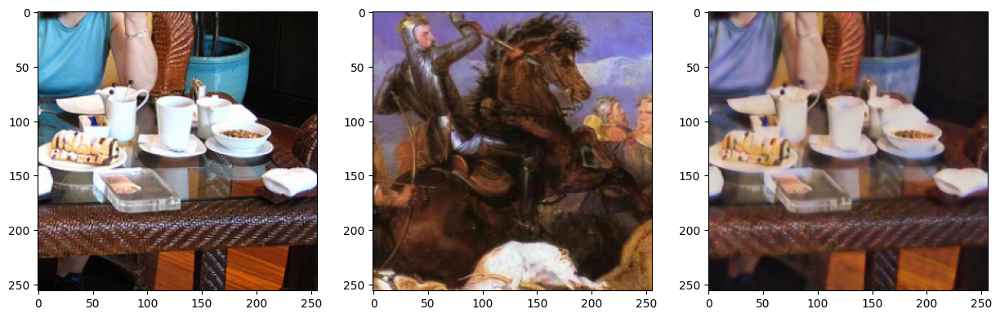

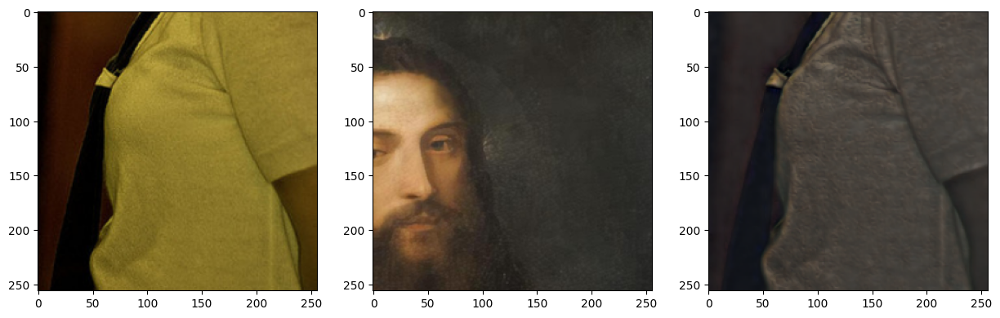

...

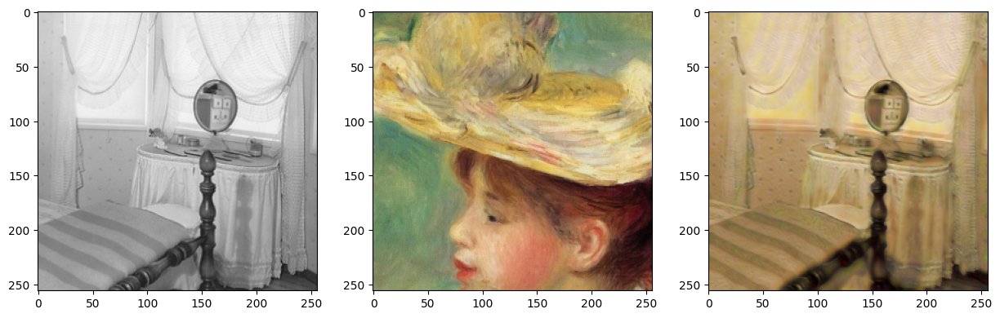

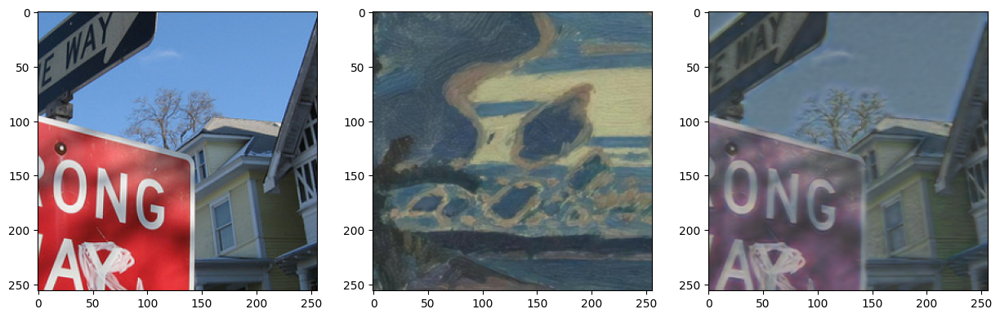

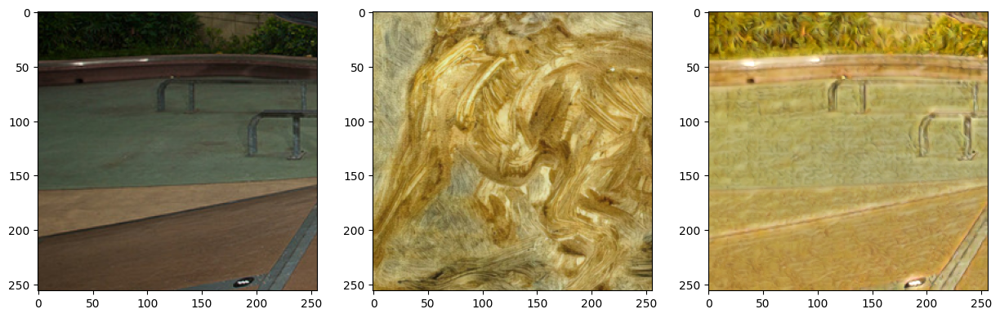

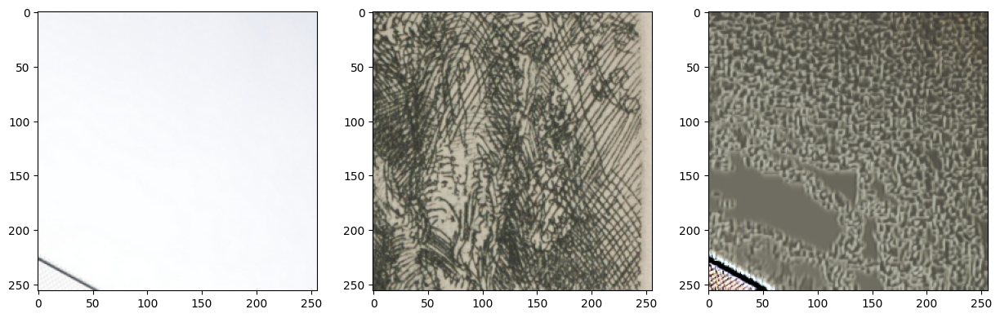

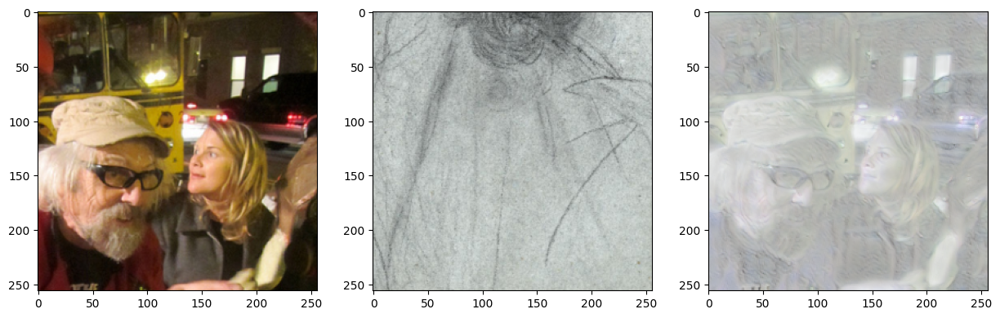

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

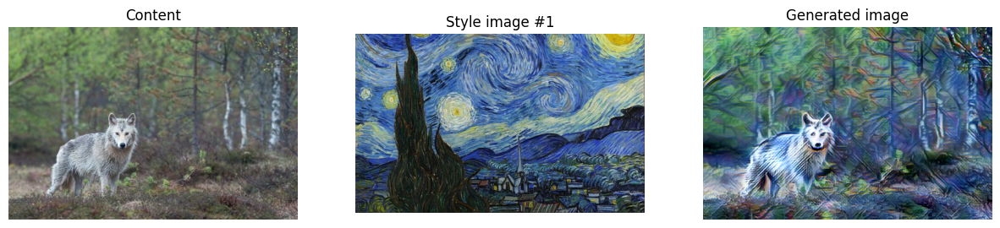

In [8]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=None)

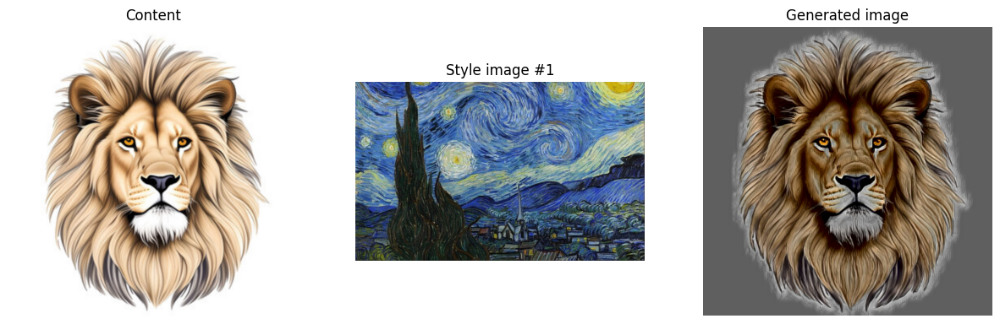

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

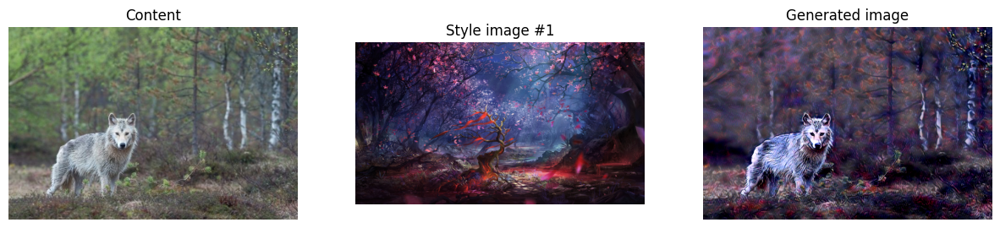

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

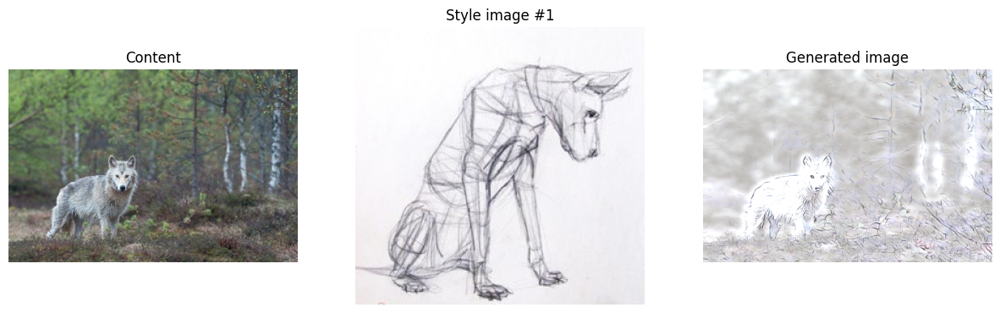

In [11]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

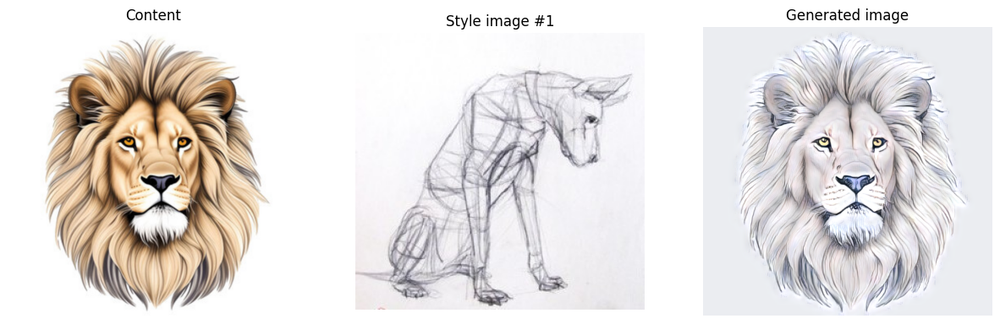

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)